In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
darren2020_ct_to_mri_cgan_path = kagglehub.dataset_download('darren2020/ct-to-mri-cgan')

print('Data source import complete.')


100%|██████████| 185M/185M [00:01<00:00, 98.4MB/s]

Extracting files...


Data source import complete.


In [ ]:
print(darren2020_ct_to_mri_cgan_path)

/root/.cache/kagglehub/datasets/darren2020/ct-to-mri-cgan/versions/5


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/

MyDrive


# Abstract:
- The study works on generating CT images from MRI images, where unsupervised learning was used using VAE-CycleGan.
Since the number of samples included in the data set used in the study, and therefore in this case we are in a state of epistemic uncertainty, therefore probabilistic models were used in forming the latent space.
- The current study is a continuation of the study ([Multi-Scale CycleGAN Night to Day](https://github.com/kaledhoshme123/Multi-Scale-CycleGAN-Night-to-Day)), but the difference between them is that in the study we were in the same field but working on generating the same scene at night or during the day, but the current study works on moving from one probability distribution to another probability distribution (i.e. studying the transition from one probability distribution to another probability distribution Another) and thus several properties included in the neural network were removed in the study ([Multi-Scale CycleGAN Night to Day](https://github.com/kaledhoshme123/Multi-Scale-CycleGAN-Night-to-Day)).
- The shaping of the latent space was adjusted by making the probability distributions of the latent space as close as possible to the standard Gaussian normal distribution.
The problem facing the research: What features does the discriminator look for to identify CT and MRI images? The same discriminator structure was used in the study ([Multi-Scale CycleGAN Night to Day](https://github.com/kaledhoshme123/Multi-Scale-CycleGAN-Night-to-Day)), but with the addition of a deeper discriminator structure (to extract more important features), and at the same time Time adjusts the features extracted from previous convolutional layers to fit the last convolutional layer in the discriminator structure.
- The derivative independence methodology used in the discriminator (which works to adjust the features that are extracted from the convolutional layers in the previous convolutional layers depending on the output of the last convolutional layer and at the same time examines the features extracted from the previous convolutional layers as real or fake (that is, the neural network in this The case is forced to adjust its weights in the previous convolutional layers so that they are real and not fake, and at the same time they must be appropriate to the output of the last convolutional layer - this helps the discriminator to have a deep understanding of the features that should be focused.
- By distinguishing between real and fake images, it helps in arriving at an accurate generating result.
- The study achieved good results when transitioning from MRI images to CT images, and acceptable results when transitioning from CT images to MRI images (the reason for this is the ease of transitioning from MRI images to CT images and its difficulty in the opposite direction. As well as the small number of samples included dataset).
- I trained the proposed model 50,000 Epochs using **Google Colab**.
- I used data augmentation to generate an additional copy of each sample that is passed over each time, in order to expand the generation capacity of the model due to the small number of samples included in the Dataset.

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import pathlib
import cv2
import string
from keras import layers, models
import matplotlib.pyplot as plt
from keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import tensorflow_probability as tfp
tfd = tfp.distributions

In [ ]:
image_shape = (256, 256, 3)
latent_space = 256
kernel = 3
padding = 'same'
learning_rate = 0.0001
weight_decay = 6e-8
filter = 16
strides = 1
source_input = layers.Input(shape = image_shape, name = 'source')
target_input = layers.Input(shape = image_shape, name = 'target')

# Model Architecture:

In [ ]:
def sampling(args):
  z_mean, z_log_v = args
  batch = tf.shape(z_mean)[0]
  dim = tf.shape(z_mean)[1]
  #e = K.random_normal(shape = (batch, dim))
  e = tf.random.normal(shape=(batch, dim))
  return z_mean + tf.exp(0.5*z_log_v)*e
  #reparameterization trick

In [ ]:
def module(inputs, filter, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                    dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    return x

In [ ]:
def convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = module(x, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    y = layers.Conv2D(filters, kernel_size = 1, padding = padding, strides = strides,
                                     activation = activation,)(inputs)
    if use_norm:
      y = layers.GroupNormalization(groups = 1)(y)

    x = layers.maximum([x, y])
    return x

In [ ]:
def encoder(inputs, filters, padding, strides, activation, kernel, use_norm, dilation_rate):
    conv = convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    return layers.MaxPooling2D()(conv), conv

def decoder(inputs, skip, filters, padding, strides, kernel, activation, use_norm, dilation_rate):
    x = layers.Conv2DTranspose(filters, kernel_size = kernel, padding = padding,
                              strides = 2, activation = activation,)(inputs)
    x = layers.maximum([x, skip])
    x = convolution(x, filters, kernel ,padding, strides, activation, use_norm, dilation_rate)
    return x

## U-NET (GENERATOR) Architecture:

In [ ]:
def U_net(inputs, filter, padding, strides, activation, kernel, use_norm, name, weights, latent_space_name):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation[0], kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation[0], kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation[0], kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation[0], kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation[0], kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation[0], kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation[0], kernel, use_norm, 1)
    x = layers.Flatten()(conv6)
    z_mean = tf.keras.layers.Dense(latent_space, name = "z_mean_{}".format(latent_space_name))(x)
    z_log_v = tf.keras.layers.Dense(latent_space, name = "z_log_v_{}".format(latent_space_name))(x)
    x = tf.keras.layers.Lambda(sampling,
                               output_shape = (latent_space,), name = latent_space_name)([z_mean, z_log_v])
    x = layers.Dense(conv7.shape[1]*conv7.shape[2]*conv7.shape[3],
                    kernel_regularizer = tf.keras.regularizers.L2(0.0001),
                    activation = activation[1])(x)
    x = layers.Reshape((conv7.shape[1], conv7.shape[2], conv7.shape[3]))(x)
    dec0 = decoder(x, skip7, filter*64, padding, strides, kernel, activation[1], use_norm, 1)
    dec = decoder(dec0, skip6, filter*32, padding, strides, kernel, activation[1], use_norm, 1)
    dec1 = decoder(dec, skip5, filter*16, padding, strides, kernel, activation[1], use_norm, 1)
    dec2 = decoder(dec1, skip4, filter*8, padding, strides, kernel, activation[1], use_norm, 1)
    dec3 = decoder(dec2, skip3, filter*4, padding, strides, kernel, activation[1], use_norm, 1)
    dec4 = decoder(dec3, skip2, filter*2, padding, strides, kernel, activation[1], use_norm, 1)
    dec5 = decoder(dec4, skip1, filter, padding, strides, kernel, activation[1], use_norm, 1)
    output = layers.Conv2DTranspose(3, kernel_size = kernel, padding = padding,
                                   strides = 1,)(dec5)
    output = layers.Activation('sigmoid')(output)
    m = models.Model(inputs = inputs, outputs = output,
                    name = name)
    if weights:
      if name == 'xTOy':
          m.load_weights('/content/drive/MyDrive/g_target_5_27.h5')
      elif name == 'yTOx':
          m.load_weights('/content/drive/MyDrive/g_source_5_27.h5')
    return m

    #/content/drive/MyDrive/

## Discriminator Architecture:

In [ ]:
def Discriminator(inputs, filter, padding, strides, kernel, activation, use_norm,
                 name, weights):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation, kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation, kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation, kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation, kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation, kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation, kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation, kernel, use_norm, 1)
    output1 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv5)
    output2 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv4)
    output3 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv3)
    output = layers.Conv2D(1, kernel_size = kernel, padding = padding, strides = 1,
                           )(conv7)
    output = layers.add([
        output,
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((4, 4))(conv5)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((6, 6))(conv4)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((11, 11))(conv3))
    ])
    m = models.Model(inputs = inputs, outputs = [output, output1, output2, output3], name = name)
    if weights:
      if name == 'xx':
          m.load_weights('/drive/My Drive/d_source_5_27.h5')
      elif name == 'yy':
          m.load_weights('/drive/My Drive/d_target_5_27.h5')
    return m

In [ ]:
from tensorflow.keras.layers import Activation, LeakyReLU

# Function to return the correct activation layer
def get_activation(name):
    if name.lower() == 'leakyrelu':
        return LeakyReLU(alpha=0.2)
    return Activation(name)  # Handles 'relu', 'sigmoid', etc.

# Apply activations properly
activation_functions = [get_activation('LeakyReLU'), get_activation('relu')]

# Use the updated activations in U_net
g_target = U_net(source_input, filter, padding,
                 strides, activation_functions, kernel, use_norm=True,
                 name='xTOy', weights=False, latent_space_name='target_latent_space')

g_source = U_net(target_input, filter, padding, strides,
                 activation_functions, kernel, use_norm=True,
                 name='yTOx', weights=False, latent_space_name='source_latent_space')


/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
def losses_normal_disribution(y_true, y_pred):
    dist = tfd.Normal(loc=0., scale=1.)
    return - tf.reduce_mean(dist.log_prob(y_pred))

In [ ]:
# Discriminator source
d_source = Discriminator(source_input, filter, 'same', 1, kernel, layers.LeakyReLU(alpha=0.2),
                         use_norm=False, name='xx', weights=False)

# Discriminator target
d_target = Discriminator(target_input, filter, 'same', 1, kernel, layers.LeakyReLU(alpha=0.2),
                         use_norm=False, name='yy', weights=False)

# Compile Discriminators
d_source.compile(loss='mse', optimizer=tf.keras.optimizers.RMSprop(
    learning_rate=learning_rate, weight_decay=weight_decay))

d_target.compile(loss='mse', optimizer=tf.keras.optimizers.RMSprop(
    learning_rate=learning_rate, weight_decay=weight_decay))

# Make discriminators non-trainable
d_source.trainable = False
d_target.trainable = False

# Forward CycleGAN
recon_target_forward = g_target(source_input)
d_target_re = d_target(recon_target_forward)
recon_source_forward = g_source(recon_target_forward)

# Backward CycleGAN
recon_source_backward = g_source(target_input)
d_source_re = d_source(recon_source_backward)
recon_target_backward = g_target(recon_source_backward)

# Define CycleGAN Model
gan = models.Model(
    inputs=[source_input, target_input],
    outputs=[
        d_target_re, d_source_re,
        recon_source_forward, recon_target_backward,
        g_target.get_layer('target_latent_space').output,
        g_source.get_layer('source_latent_space').output
    ],
    name='generative_gan'
)

# Loss Weights
loss_weights = [2, 1, 0.7, 0.5, 2, 1, 0.7, 0.5, 10, 10, 0.5, 0.5]

# Losses
losses = ['mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mae', 'mae',
          losses_normal_disribution, losses_normal_disribution]

# Compile CycleGAN
gan.compile(
    loss=losses,
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate, weight_decay=weight_decay),
    loss_weights=loss_weights
)


In [ ]:
gan.output

[[<KerasTensor shape=(None, 2, 2, 1), dtype=float32, sparse=False, name=keras_tensor_543>,
  <KerasTensor shape=(None, 8, 8, 1), dtype=float32, sparse=False, name=keras_tensor_544>,
  <KerasTensor shape=(None, 16, 16, 1), dtype=float32, sparse=False, name=keras_tensor_545>,
  <KerasTensor shape=(None, 32, 32, 1), dtype=float32, sparse=False, name=keras_tensor_546>],
 [<KerasTensor shape=(None, 2, 2, 1), dtype=float32, sparse=False, name=keras_tensor_549>,
  <KerasTensor shape=(None, 8, 8, 1), dtype=float32, sparse=False, name=keras_tensor_550>,
  <KerasTensor shape=(None, 16, 16, 1), dtype=float32, sparse=False, name=keras_tensor_551>,
  <KerasTensor shape=(None, 32, 32, 1), dtype=float32, sparse=False, name=keras_tensor_552>],
 <KerasTensor shape=(None, 256, 256, 3), dtype=float32, sparse=False, name=keras_tensor_547>,
 <KerasTensor shape=(None, 256, 256, 3), dtype=float32, sparse=False, name=keras_tensor_553>,
 <KerasTensor shape=(None, 256), dtype=float32, sparse=False, name=keras_t

In [ ]:
gan.summary()

Model: "generative_gan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ source (InputLayer)       │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ target (InputLayer)       │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 16)   │            448 │ source[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_56 (Conv2D)        │ (None, 256, 256, 16)   │            448 │ target[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 256, 256, 16)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_44             │ (None, 256, 256, 16)   │              0 │ conv2d_56[0][0]        │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ group_normalization       │ (None, 256, 256, 16)   │             32 │ activation_1[0][0]     │
│ (GroupNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ group_normalization_56    │ (None, 256, 256, 16)   │             32 │ activation_44[0][0]    │
│ (GroupNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 16)   │          2,320 │ group_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_57 (Conv2D)        │ (None, 256, 256, 16)   │          2,320 │ group_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 256, 256, 16)   │              0 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_45             │ (None, 256, 256, 16)   │              0 │ conv2d_57[0][0]        │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ group_normalization_1     │ (None, 256, 256, 16)   │             32 │ activation_2[0][0]     │
│ (GroupNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ group_normalization_57    │ (None, 256, 256, 16)   │             32 │ activation_45[0][0]    │
│ (GroupNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 256, 256, 16)   │          2,320 │ group_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_58 (Conv2D)        │ (None, 256, 256, 16)   │          2,320 │ group_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activat

 Total params: 249,005,652 (949.88 MB)

 Trainable params: 184,647,686 (704.38 MB)

 Non-trainable params: 64,357,966 (245.51 MB)

In [ ]:
def read_images(pathes):
    images = []
    for img in pathes:
        img = cv2.imread(str(img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img/255
        images.append(img)
    return np.array(images)

In [ ]:
import cv2
import numpy as np

def read_images(pathes):
    images = []
    for img in pathes:
        image = cv2.imread(str(img))
        if image is None:
            print(f"Warning: Could not read image {img}")
            continue  # Skip this image

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        image = image / 255.0  # Normalize
        images.append(image)

    if not images:
        raise ValueError("Error: No valid images were loaded!")

    return np.array(images)


In [ ]:
trainA_path = "/root/.cache/kagglehub/datasets/darren2020/ct-to-mri-cgan/versions/5/Dataset/images/trainA"
trainB_path = "/root/.cache/kagglehub/datasets/darren2020/ct-to-mri-cgan/versions/5/Dataset/images/trainB"


In [ ]:
import os

print("TrainA exists:", os.path.exists(trainA_path))
print("TrainB exists:", os.path.exists(trainB_path))


TrainA exists: True
TrainB exists: True


In [ ]:
source_pathes = np.array(sorted(list(pathlib.Path(trainA_path).glob('*.*'))))
target_pathes = np.array(sorted(list(pathlib.Path(trainB_path).glob('*.*'))))


In [ ]:
import matplotlib.pyplot as plt
def samples(G, start):
    images = G.predict(start, verbose = 0)
    allImages = np.vstack([start, images])
    plt.figure(figsize = (12, 3))
    for i in range(16):
        plt.subplot(2, 8, (i + 1))
        plt.imshow(allImages[i])
    plt.show()

In [ ]:
import os

def save_weight(g_target, g_source, d_source, d_target):
    save_path = "/content/drive/My Drive"

    # Ensure the directory exists
    os.makedirs(save_path, exist_ok=True)

    # Save model weights
    g_target.save_weights('/content/drive/My Drive/g_target_5_28.weights.h5')
    g_source.save_weights('/content/drive/My Drive/g_source_5_28.weights.h5')
    d_source.save_weights('/content/drive/My Drive/d_source_5_28.weights.h5')
    d_target.save_weights('/content/drive/My Drive/d_target_5_28.weights.h5')


    print("✅ Model weights saved successfully in Google Drive.")



In [ ]:
# def save_weight(g_target, g_source, d_source, d_target):
#     g_target.save_weights('/content/drive/MyDrive/g_target_5_28.h5')
#     g_source.save_weights('/content/drive/MyDrive/g_source_5_28.h5')
#     d_source.save_weights('/content/drive/MyDrive/d_source_5_28.h5')
#     d_target.save_weights('/content/drive/MyDrive/d_target_5_28.h5')

In [ ]:
generator = ImageDataGenerator(
    rotation_range = 0.1, width_shift_range = 0.05, height_shift_range= 0.05,
    shear_range = 0.05, zoom_range= 0.3, fill_mode = "constant",
    horizontal_flip = True, vertical_flip = True
)

def data_augmentation(images):
  final_images = []
  for index, value in enumerate(images):
    for i in range(2):
      #new_image = generator.flow(np.reshape(value, (1, 256, 256, 3))).next()
      new_image = next(generator.flow(np.reshape(value, (1, 256, 256, 3))))
      final_images.append(np.reshape(new_image, (256, 256, 3)))
  return np.array(final_images)

In [ ]:
def getPatchGan(shape_):
  return np.vstack([tf.ones(shape = shape_),
                            tf.zeros(shape = shape_)])
def ones(shape_):
  return tf.ones(shape = shape_)

def get_normal_samples(batch_size):
  return tf.random.normal(shape = (batch_size, latent_space), mean = 0, stddev = 1)

/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


✅ Model weights saved successfully in Google Drive.
Epoch: 0/300
source_discr: 1.8495663404464722, target_discr: 1.8830461502075195 source_ADV: 0.7964231967926025, target_ADV: 0.8515676259994507 
recon_target_loss :0.3681890666484833, recon_source_loss: 0.4677829146385193 
Normal Log loss: 22.660518646240234
Source to Target Samples


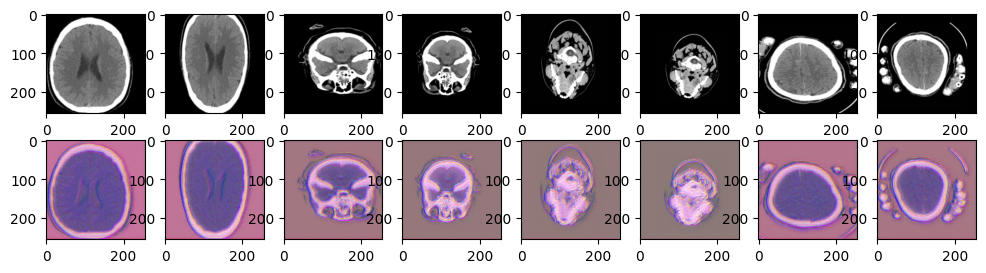

Target to Source Samples


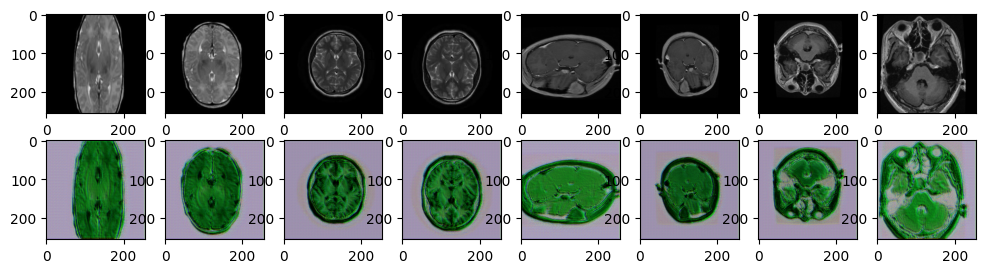

Epoch: 100/300
source_discr: 1.872814416885376, target_discr: 1.834423303604126 source_ADV: 0.7942715883255005, target_ADV: 0.8613340854644775 
recon_target_loss :0.0974898487329483, recon_source_loss: 0.14584554731845856 
Normal Log loss: 2.5411794185638428
Source to Target Samples


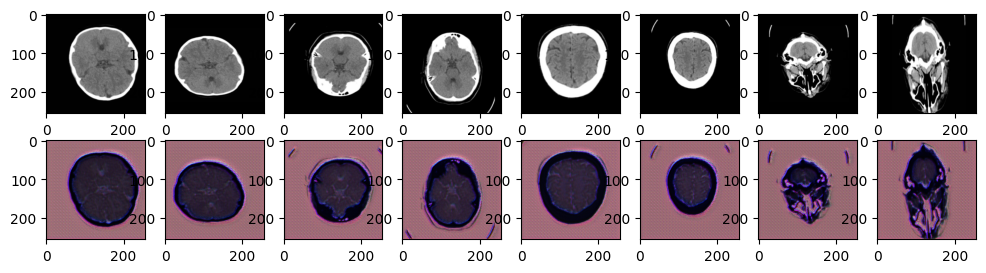

Target to Source Samples


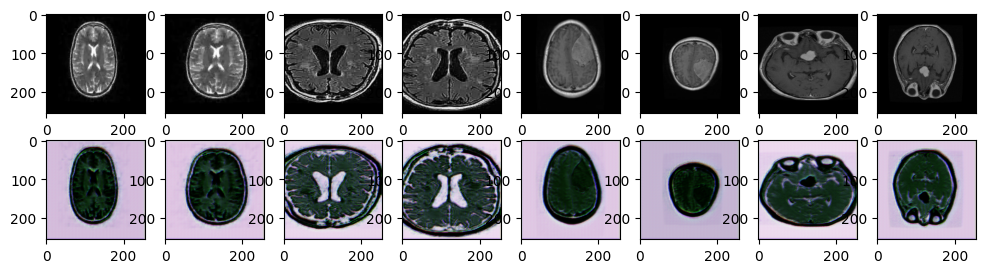

✅ Model weights saved successfully in Google Drive.
Epoch: 200/300
source_discr: 1.9018564224243164, target_discr: 1.8393217325210571 source_ADV: 0.7662659287452698, target_ADV: 0.8513851761817932 
recon_target_loss :0.07065907120704651, recon_source_loss: 0.11473742872476578 
Normal Log loss: 2.2725868225097656
Source to Target Samples


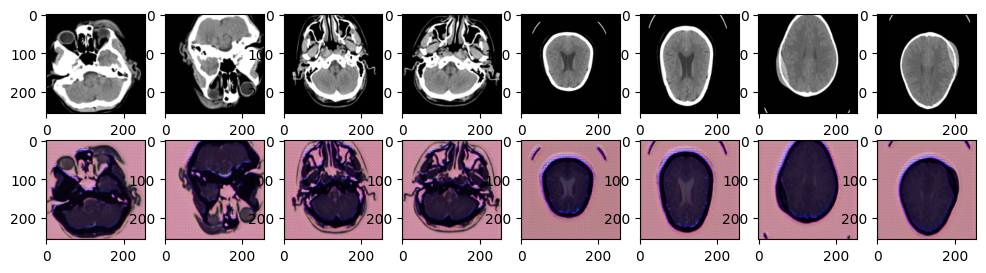

Target to Source Samples


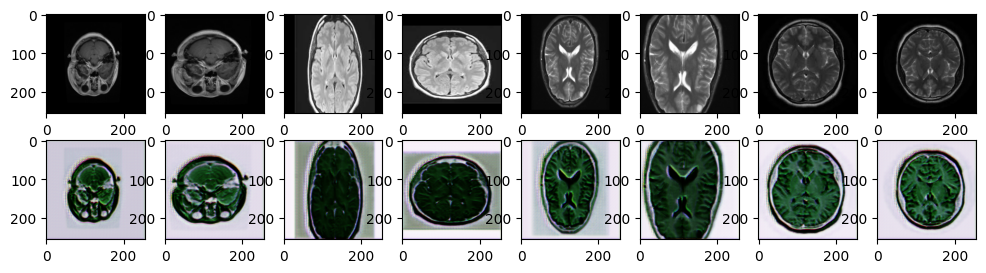

In [ ]:
epochs = 300
batch_size = 4
batch_after_augmentation = batch_size*2
patchGan = (batch_after_augmentation, 2, 2, 1)
patchGan1 = (batch_after_augmentation, 8, 8, 1)
patchGan2 = (batch_after_augmentation, 16, 16, 1)
patchGan3 = (batch_after_augmentation, 32, 32, 1)

for i in range(epochs):
    indexs = np.random.randint(1740, size = (batch_size,))
    source_images = data_augmentation(read_images(source_pathes[indexs]))
    target_images = data_augmentation(read_images(target_pathes[indexs]))
    real_source = source_images
    real_target = target_images
    fake_source = g_source.predict(real_target, verbose = 0)
    fake_target = g_target.predict(real_source, verbose = 0)
    allImagesSource = np.vstack([real_source, fake_source])
    allImagesTarget = np.vstack([real_target, fake_target])
    all_d_source, d1, d2, d3, d4  = d_source.train_on_batch(allImagesSource, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_d_target, dt1, dt2, dt3, dt4  = d_target.train_on_batch(allImagesTarget, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_loss, loss_1_1, loss_1_2, loss_1_3, loss_1_4, loss_2_1, loss_2_2, loss_2_3, loss_2_4, loss_3, loss_4, nloss1, nloss2 = gan.train_on_batch([real_source, real_target],
                                                       [[ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       [ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       real_source,
                                                       real_target,
                                                       get_normal_samples(batch_after_augmentation),
                                                       get_normal_samples(batch_after_augmentation)])
    if i%200 == 0:
        save_weight(g_target, g_source, d_source, d_target)
    if i%100 == 0:
        print('Epoch: {}/{}'.format(i, epochs))
        str_ = 'source_discr: {}, target_discr: {}'.format(all_d_source, all_d_target)
        str_2 = 'source_ADV: {}, target_ADV: {}'.format((loss_1_1 + loss_1_2 + loss_1_3 + loss_1_4)/4,
                                                            (loss_2_1 + loss_2_2 + loss_2_3 + loss_2_4)/4)
        str_3 = 'recon_target_loss :{}, recon_source_loss: {}'.format(loss_3, loss_4)
        print(str_ + ' ' +str_2 + ' ')
        print(str_3 + ' ')
        print('Normal Log loss: {}'.format((nloss1 + nloss2)))
        print('Source to Target Samples')
        samples(g_target, real_source)
        print('Target to Source Samples')
        samples(g_source, real_target)

In [ ]:
print("Length of source_pathes:", len(source_pathes))
print("Length of target_pathes:", len(target_pathes))


Length of source_pathes: 1742
Length of target_pathes: 1744


In [ ]:
save_weight(g_target, g_source, d_source, d_target)

✅ Model weights saved successfully in Google Drive.


In [ ]:
def draw_compare(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 16))
  index = 0
  n = 0
  for i in range(36):
    plt.subplot(6, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

In [ ]:
def generator_samples(pathes_, m, type_):
  indexs = np.random.randint(1700, size = (18,))
  images = read_images(pathes_[indexs])
  draw_compare(np.squeeze(m.predict(images, verbose = 0)), images, type_)

# Results:
The model has been tested in generating a number of CT scan images from MRI images, and vice versa, and the results are shown in the samples that we showed.

<ipython-input-38-623b885894dc>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


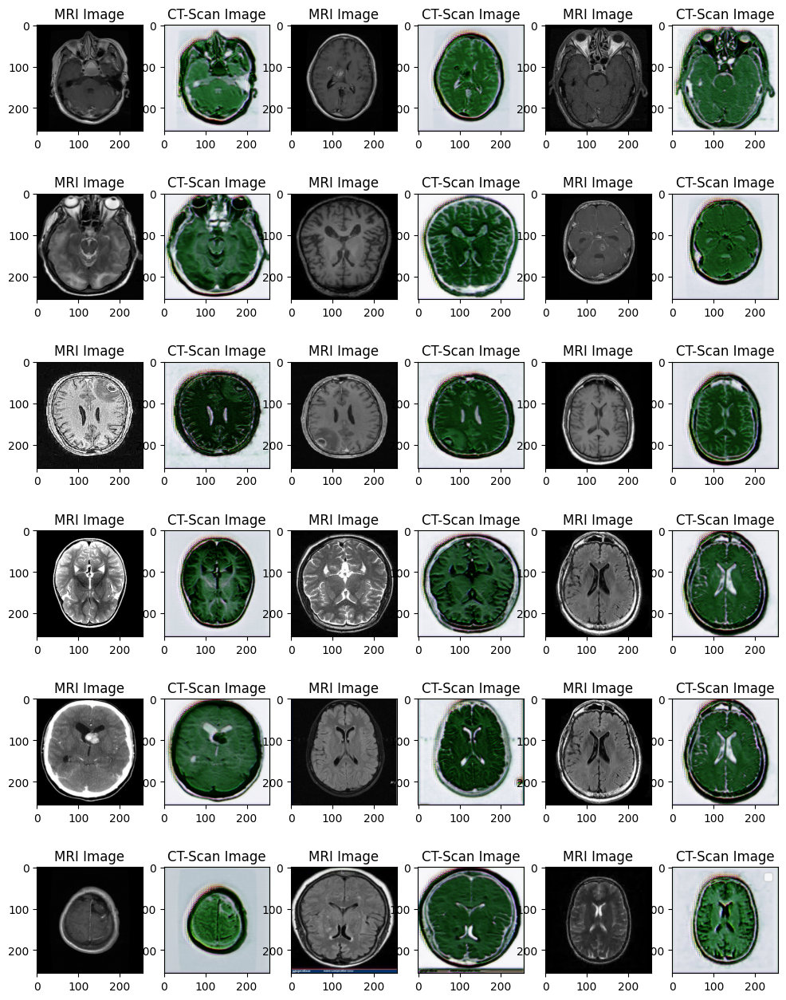

In [ ]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

<ipython-input-38-623b885894dc>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


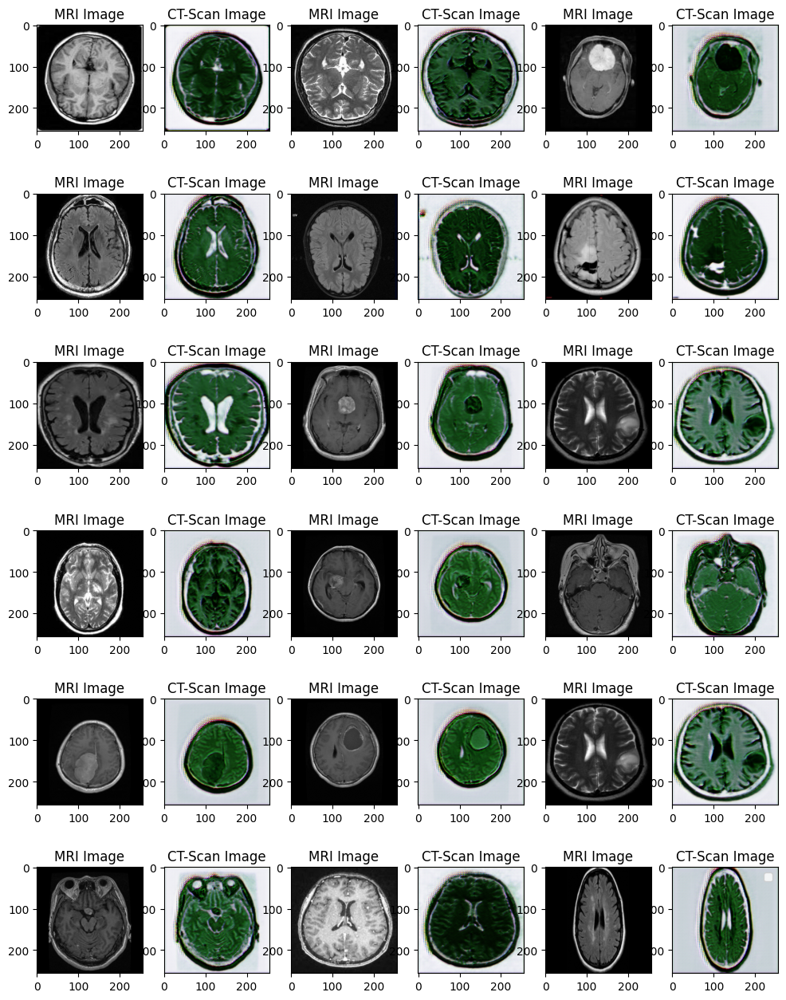

In [ ]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

<ipython-input-38-623b885894dc>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


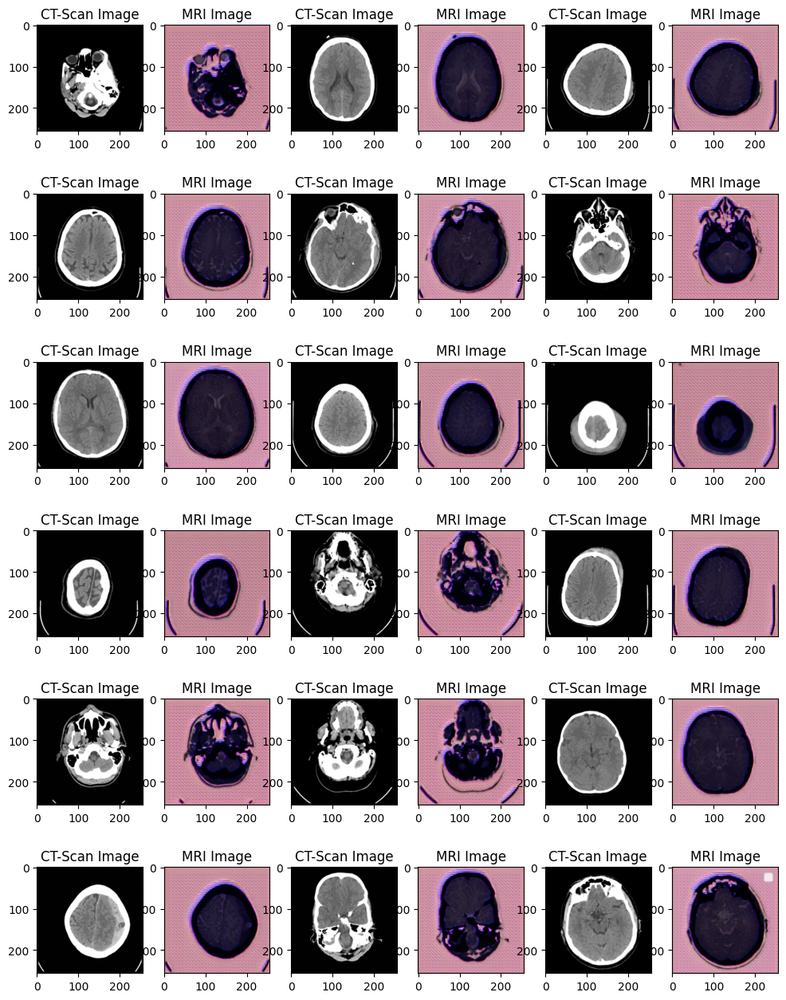

In [ ]:
generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

<ipython-input-38-623b885894dc>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


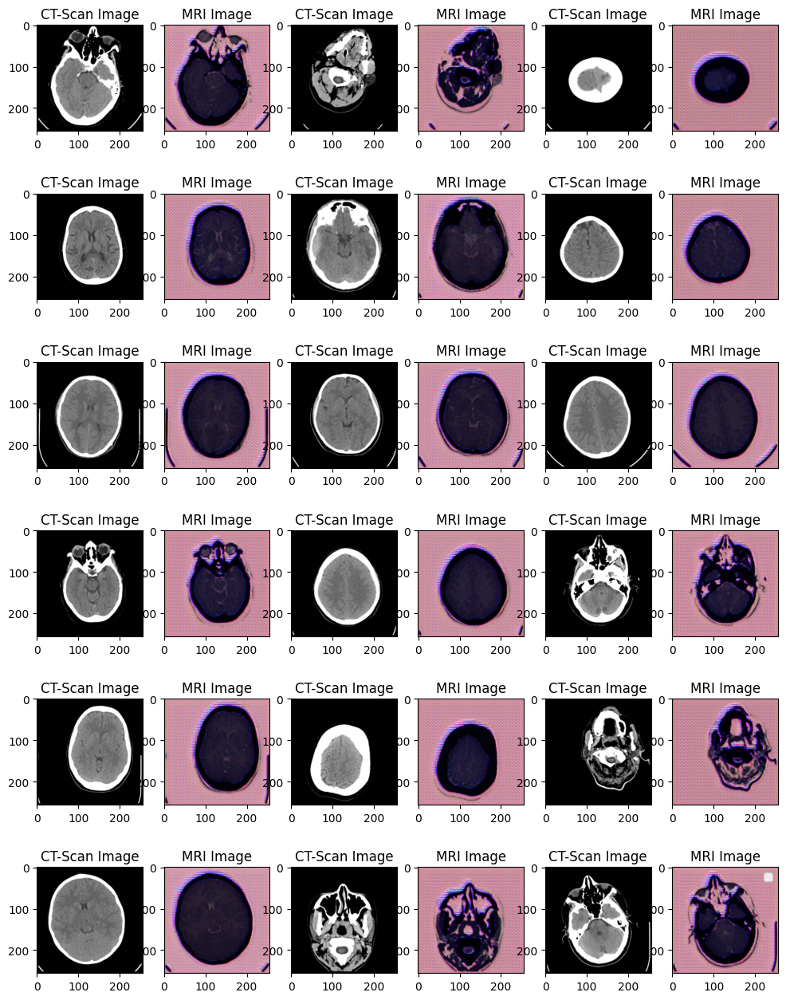

In [ ]:
generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

# Test Generation:

- In order to use a more reliable methodology in evaluating the performance of the model that I trained, I used images that the model did not see during training, and for each image I did the following:
# The Fisrt Case:
- I have CT images that I converted into an MRI, then I recovered the CT image from the MRI images, and then I studied the difference between the basic CT images and the CT images that were retrieved from the MRI that was generated from the CT images.
- We note here that the loss is small for the CT images, and this indicates that the trained model was able to study the correspondence of the two probability distributions for each type.
# The second case:
- Moving from MRI images to CT images and then restoring the MRI from the CT images. Thus, we notice that the loss here is greater when comparing the original MRI images to the generated images, due to the small number of samples included in the dataset.

# Conclusion
- This measure is considered acceptable for studying the success of the obstetrics process, but it is not a source of trust for me yet, because the number of samples is small, and therefore in this case the proposed model is forced to study the convergence between the two probability distributions (CT images and MRI images), and therefore in this case, given the lack of samples and the damage The model is to reduce the value of the loss in each round. Some cases may be incorrect during the projection process, but since the samples are small, the result is considered acceptable.

In [ ]:
def draw_samples(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 9))
  index = 0
  n = 0
  for i in range(24):
    plt.subplot(4, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

In [ ]:
trainA_path = "/root/.cache/kagglehub/datasets/darren2020/ct-to-mri-cgan/versions/5/Dataset/images/trainA"
trainB_path = "/root/.cache/kagglehub/datasets/darren2020/ct-to-mri-cgan/versions/5/Dataset/images/trainB"


In [ ]:
ct_pathes = np.array(sorted(list(pathlib.Path('/root/.cache/kagglehub/datasets/darren2020/ct-to-mri-cgan/versions/5/Dataset/unseen_demo_images/ct').glob('*.*'))))
mri_pathes = np.array(sorted(list(pathlib.Path('/root/.cache/kagglehub/datasets/darren2020/ct-to-mri-cgan/versions/5/Dataset/unseen_demo_images/mri').glob('*.*'))))


In [ ]:
ctImagesGeneration = g_source.predict(g_target.predict(read_images(ct_pathes)))
ctImagesGeneration.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


(15, 256, 256, 3)

In [ ]:
ctOrginalImages = read_images(ct_pathes)
ctOrginalImages.shape

(15, 256, 256, 3)

<ipython-input-44-8342bd75b94b>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


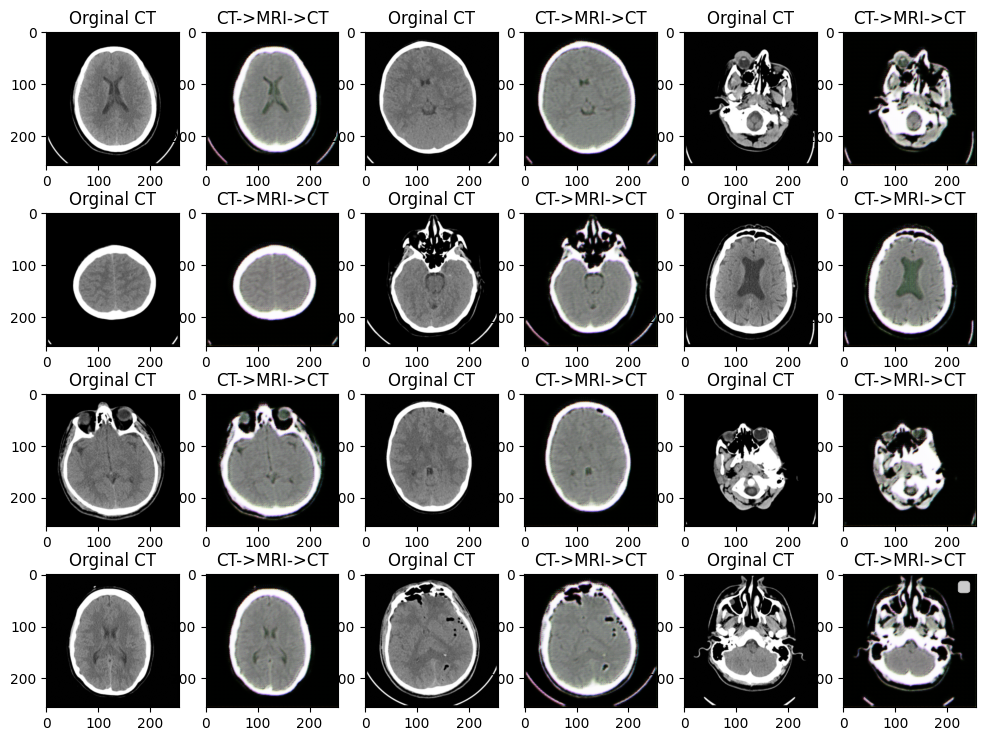

In [ ]:
draw_samples(ctImagesGeneration, ctOrginalImages, ['Orginal CT', 'CT->MRI->CT'])

In [ ]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(ctOrginalImages),
                                                 tf.keras.layers.Flatten()(ctImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.24106717109680176>

In [ ]:
mriImagesGeneration = g_target.predict(g_source.predict(read_images(mri_pathes)))
mriImagesGeneration.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


(15, 256, 256, 3)

In [ ]:
mriOrginalImages = read_images(mri_pathes)
mriOrginalImages.shape

(15, 256, 256, 3)

<ipython-input-44-8342bd75b94b>:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


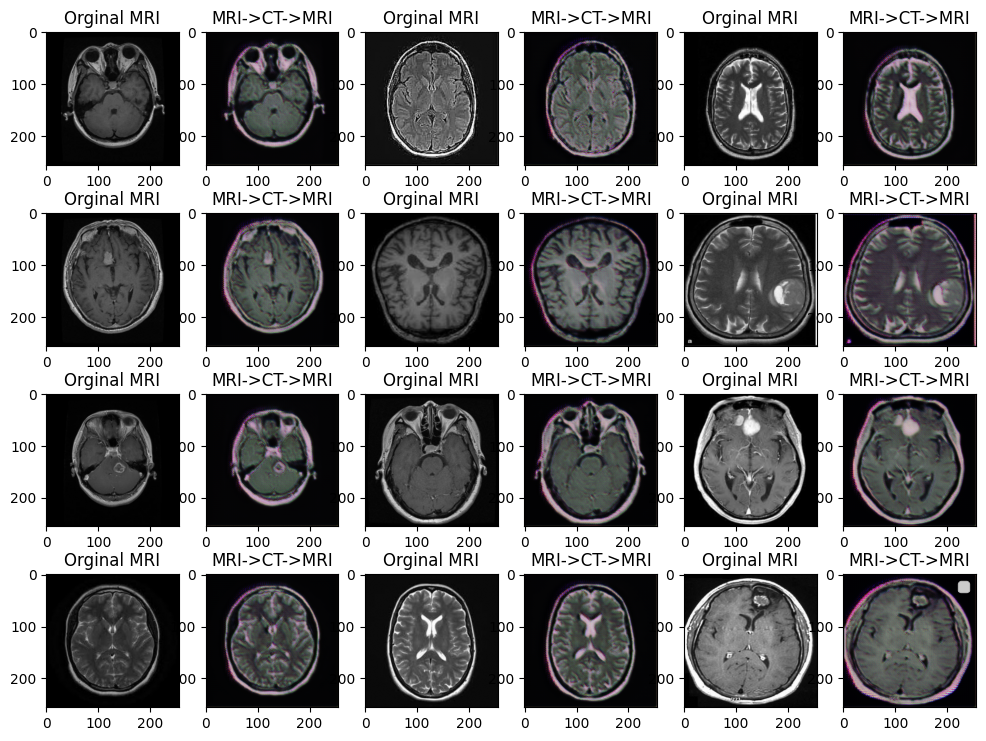

In [ ]:
draw_samples(mriImagesGeneration, mriOrginalImages, ['Orginal MRI', 'MRI->CT->MRI'])

In [ ]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(mriOrginalImages),
                                                 tf.keras.layers.Flatten()(mriImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.37493279576301575>

# resolution


In [ ]:
import torch
import numpy as np
import cv2
import RRDBNet_arch as arch
import os

# Load the Pretrained Model
model_path = '/content/RRDB_PSNR_x4.pth'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = arch.RRDBNet(3, 3, 64, 23, gc=32)
model.load_state_dict(torch.load(model_path, map_location=device), strict=True)
model.eval()
model.to(device)

print(f"Model loaded from {model_path}. Processing {len(mriImagesGeneration)} images...")

# Create output directory if not exists
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

# Process Each Image in `mriImagesGeneration`
high_res_images = []
for idx, img in enumerate(mriImagesGeneration):
    # Convert Image to Proper Format for Model
    img = img * 1.0 / 255  # Normalize to [0,1]
    img = torch.from_numpy(np.transpose(img, (2, 0, 1))).float().unsqueeze(0).to(device)

    # Super-Resolution Processing
    with torch.no_grad():
        output = model(img).squeeze().cpu().clamp_(0, 1).numpy()

    # Convert Back to Image Format
    output = np.transpose(output, (1, 2, 0)) * 255.0
    output = output.round().astype(np.uint8)

    # Save Image
    output_path = os.path.join(output_dir, f"mri_hr_{idx+1}.png")
    cv2.imwrite(output_path, output)
    high_res_images.append(output)

    print(f"Saved High-Resolution Image: {output_path}")

print("✅ All MRI images processed successfully!")


Model loaded from /content/RRDB_PSNR_x4.pth. Processing 15 images...
Saved High-Resolution Image: results/mri_hr_1.png
Saved High-Resolution Image: results/mri_hr_2.png
Saved High-Resolution Image: results/mri_hr_3.png
Saved High-Resolution Image: results/mri_hr_4.png
Saved High-Resolution Image: results/mri_hr_5.png
Saved High-Resolution Image: results/mri_hr_6.png
Saved High-Resolution Image: results/mri_hr_7.png
Saved High-Resolution Image: results/mri_hr_8.png
Saved High-Resolution Image: results/mri_hr_9.png
Saved High-Resolution Image: results/mri_hr_10.png
Saved High-Resolution Image: results/mri_hr_11.png
Saved High-Resolution Image: results/mri_hr_12.png
Saved High-Resolution Image: results/mri_hr_13.png
Saved High-Resolution Image: results/mri_hr_14.png
Saved High-Resolution Image: results/mri_hr_15.png
✅ All MRI images processed successfully!


In [ ]:
# Save Original Images Before Super-Resolution
original_dir = "originals"
os.makedirs(original_dir, exist_ok=True)

for idx, img in enumerate(mriImagesGeneration):
    original_path = os.path.join(original_dir, f"mri_original_{idx+1}.png")
    cv2.imwrite(original_path, img)
    print(f"Saved Original Image: {original_path}")

Saved Original Image: originals/mri_original_1.png
Saved Original Image: originals/mri_original_2.png
Saved Original Image: originals/mri_original_3.png
Saved Original Image: originals/mri_original_4.png
Saved Original Image: originals/mri_original_5.png
Saved Original Image: originals/mri_original_6.png
Saved Original Image: originals/mri_original_7.png
Saved Original Image: originals/mri_original_8.png
Saved Original Image: originals/mri_original_9.png
Saved Original Image: originals/mri_original_10.png
Saved Original Image: originals/mri_original_11.png
Saved Original Image: originals/mri_original_12.png
Saved Original Image: originals/mri_original_13.png
Saved Original Image: originals/mri_original_14.png
Saved Original Image: originals/mri_original_15.png


In [ ]:
import torch
import numpy as np
import cv2
import RRDBNet_arch as arch
import os
import tensorflow as tf
from sklearn.metrics import roc_auc_score, f1_score
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load the Pretrained Model
model_path = '/content/RRDB_PSNR_x4.pth'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = arch.RRDBNet(3, 3, 64, 23, gc=32)
model.load_state_dict(torch.load(model_path, map_location=device), strict=True)
model.eval()
model.to(device)

print(f"✅ Model loaded from {model_path}. Processing {len(mriImagesGeneration)} images...")

# Create directories for saving images
original_dir = "originals"
high_res_dir = "results"
os.makedirs(original_dir, exist_ok=True)
os.makedirs(high_res_dir, exist_ok=True)

# Lists to store images for loss computation
mriOriginalImages = []
mriHighResImages = []

# Process Each Image in `mriImagesGeneration`
for idx, img in enumerate(mriImagesGeneration):
    # Ensure Image has the correct format
    if img.dtype != np.uint8:
        img = (img * 255).clip(0, 255).astype(np.uint8)

    # Save Original Image
    original_path = os.path.join(original_dir, f"mri_original_{idx+1}.png")
    cv2.imwrite(original_path, img)
    print(f"✅ Saved Original Image: {original_path}")

    # Store original image as numpy array for loss computation
    original_img_resized = img.astype(np.float32) / 255.0
    mriOriginalImages.append(original_img_resized)

    # Convert Image for Model Processing
    img = img.astype(np.float32) / 255.0  # Normalize to [0,1]
    img = torch.from_numpy(np.transpose(img, (2, 0, 1))).float().unsqueeze(0).to(device)

    # Super-Resolution Processing
    with torch.no_grad():
        output = model(img).squeeze().cpu().clamp_(0, 1).numpy()

    # Convert Back to Image Format
    output = np.transpose(output, (1, 2, 0))
    output = (output * 255.0).round().astype(np.uint8)

    # Save High-Resolution Image
    high_res_path = os.path.join(high_res_dir, f"mri_hr_{idx+1}.png")
    cv2.imwrite(high_res_path, output)
    print(f"✅ Saved High-Resolution Image: {high_res_path}")

    # Resize High-Resolution Image to Match Original Size
    output_resized = cv2.resize(output, (original_img_resized.shape[1], original_img_resized.shape[0]))
    mriHighResImages.append(output_resized.astype(np.float32) / 255.0)

print("🎉 All MRI images processed successfully!")

# Convert lists to numpy arrays for loss computation
mriOriginalImages = np.array(mriOriginalImages)
mriHighResImages = np.array(mriHighResImages)

# Compute Binary Crossentropy (BCE) Loss
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(
    tf.keras.layers.Flatten()(mriOriginalImages),
    tf.keras.layers.Flatten()(mriHighResImages)
))

print(f"📉 BCE Loss between Original and High-Resolution images: {loss_value.numpy():.6f}")

# Compute AUC-ROC Score
flattened_original = mriOriginalImages.flatten()
flattened_hr = mriHighResImages.flatten()
auc_roc_score = roc_auc_score(flattened_original > 0.5, flattened_hr)  # Threshold at 0.5
print(f"📊 AUC-ROC Score: {auc_roc_score:.6f}")

# Compute F1-Score
f1 = f1_score(flattened_original > 0.5, flattened_hr > 0.5)  # Binary thresholding
print(f"🔢 F1-Score: {f1:.6f}")

# Compute PSNR for each image pair
psnr_values = [psnr(mriOriginalImages[i], mriHighResImages[i], data_range=1.0) for i in range(len(mriOriginalImages))]
avg_psnr = np.mean(psnr_values)
print(f"📈 Average PSNR: {avg_psnr:.6f} dB")

# Compute SSIM for each image pair
# Compute SSIM for each image pair
ssim_values = [
    ssim(mriOriginalImages[i], mriHighResImages[i],
         channel_axis=-1, data_range=1.0, win_size=5)  # Use `win_size=5` for small images
    for i in range(len(mriOriginalImages))
]
avg_ssim = np.mean(ssim_values)
print(f"🖼️ Average SSIM: {avg_ssim:.6f}")



✅ Model loaded from /content/RRDB_PSNR_x4.pth. Processing 15 images...
✅ Saved Original Image: originals/mri_original_1.png
✅ Saved High-Resolution Image: results/mri_hr_1.png
✅ Saved Original Image: originals/mri_original_2.png
✅ Saved High-Resolution Image: results/mri_hr_2.png
✅ Saved Original Image: originals/mri_original_3.png
✅ Saved High-Resolution Image: results/mri_hr_3.png
✅ Saved Original Image: originals/mri_original_4.png
✅ Saved High-Resolution Image: results/mri_hr_4.png
✅ Saved Original Image: originals/mri_original_5.png
✅ Saved High-Resolution Image: results/mri_hr_5.png
✅ Saved Original Image: originals/mri_original_6.png
✅ Saved High-Resolution Image: results/mri_hr_6.png
✅ Saved Original Image: originals/mri_original_7.png
✅ Saved High-Resolution Image: results/mri_hr_7.png
✅ Saved Original Image: originals/mri_original_8.png
✅ Saved High-Resolution Image: results/mri_hr_8.png
✅ Saved Original Image: originals/mri_original_9.png
✅ Saved High-Resolution Image: resul